# Exploring Proteins with Neurosnap: Visualization and Analysis Techniques
[![Neurosnap Header](https://raw.githubusercontent.com/NeurosnapInc/neurosnap/refs/heads/main/assets/header.webp)](https://neurosnap.ai/)

In this tutorial, we demonstrate how to use the Protein class and associated methods from the [Neurosnap tools package](https://github.com/NeurosnapInc/neurosnap/), as well as how to interpret and create visualizations of the outputs.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/NeurosnapInc/neurosnap/blob/main/example_notebooks/protein.ipynb)

#### Part 0. Installing Dependencies on Colab

In [1]:
import subprocess
import sys

if 'google.colab' in sys.modules:
    subprocess.run("pip install -U --no-cache-dir git+https://github.com/NeurosnapInc/neurosnap.git", shell=True, check=True, executable="/bin/bash")
    subprocess.run("pip install py3Dmol", shell=True, check=True, executable="/bin/bash")

#### Part 1. Using the `Protein` class to load a protein from disk, PDB ID, or UniProt ID
As the first step, we create a Neurosnap protein structure. In this example, we use the PDB ID [**6NT6**](https://www.rcsb.org/structure/6NT6), which corresponds to a Cryo-EM structure of the full-length chicken STING protein in its apo state. STING is an endoplasmic reticulum membrane protein that consists of four transmembrane helices, followed by a cytoplasmic ligand-binding and signaling domain.

In [2]:
import warnings

import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import py3Dmol
from IPython.display import HTML, display
from neurosnap.protein import *
from neurosnap.rendering import animate_frames, render_pseudo3D, render_protein_pseudo3D

prot = Protein("6NT6") # specify the PDB ID, Uniprot ID, or file path to a PDB file
print(prot) # calling the __repr__ method in the Protein class
print("Models:", prot.models()) # .models() returns a list of the models in the protein
print("Chains:", prot.chains()) # .chains() returns a list of the chains in the protein
print("Sequence of A chain:", prot.get_aas("A")) # .get_aas() returns the amino acid sequence of a chain in the specified model
display(prot.df)

[*] Found matching structure in RCSB PDB, downloading and using that.


<Neurosnap Protein: Title=6NT6 Models=[0], Chains=[A, B], Atoms=4198>
Models: [0]
Chains: ['A', 'B']
Sequence of A chain: PARLLIPEPRAGRARHAACVLLAVCFVVLFL


,model,chain,res_id,res_name,res_type,atom,atom_name,bfactor,x,y,z,mass
0,0,A,11,PRO,AMINO_ACID,1,N,137.62,99.663002,55.676998,97.700996,14.0067
1,0,A,11,PRO,AMINO_ACID,2,CA,137.62,98.334999,55.997002,98.224998,12.0107
2,0,A,11,PRO,AMINO_ACID,3,C,137.62,97.235001,55.583000,97.262001,12.0107
3,0,A,11,PRO,AMINO_ACID,4,O,137.62,97.198997,54.433998,96.835999,15.9994
4,0,A,11,PRO,AMINO_ACID,5,CB,137.62,98.384003,57.512001,98.379997,12.0107
...,...,...,...,...,...,...,...,...,...,...,...,...
4193,0,B,346,TYR,AMINO_ACID,4195,N,147.55,106.466003,73.766998,104.588997,14.0067
4194,0,B,346,TYR,AMINO_ACID,4196,CA,147.55,107.870003,74.037003,104.330002,12.0107
4195,0,B,346,TYR,AMINO_ACID,4197,C,147.55,108.053001,74.495003,102.889000,12.0107
4196,0,B,346,TYR,AMINO_ACID,4198,O,147.55,107.086998,74.581001,102.130997,15.9994


Let's use the DataFrame to see what types of residues the loaded structure contains.

In [ ]:
print(prot.df["res_type"].unique())

['AMINO_ACID']


#### Part 2. Modification of the Loaded Structure
In this example, we load the PDB ID [**6PQN**](https://www.rcsb.org/structure/6PQN), which corresponds to the crystal structure of HzTransib transposase. Transib is a RAG1-like transposase from *Helicoverpa zea*, capturing the entire transposition process from the apo enzyme to the terminal strand transfer complex, with transposon ends covalently joined to target DNA.

We will demonstrate how to modify and save these structures. Here, we can use the `remove_waters` and `remove_non_biopolymers` methods.

The remove_waters method removes all water molecules (**residues named 'WAT' or 'HOH'**) from the structure. It is suggested to call `.renumber()` afterwards as well.

The remove_non_biopolymers method removes **all ligands, heteroatoms, and non-biopolymer residues** from the selected structure. Non-biopolymer residues are considered any residues that are not standard amino acids or standard nucleotides (DNA/RNA). If no model or chain is provided, it will remove from the entire structure. The parameters for this method include:
- model: The model ID to process; if not provided, it will use all models (int).
- chain: The chain ID to process; if not provided, it will use all chains (str).

In [4]:
with warnings.catch_warnings(): # not necessary - hides an annoying warning
  warnings.simplefilter("ignore") # not necessary - hides an annoying warning
  prot = Protein("6PQN") # actually required

display(prot.df)

[*] Found matching structure in RCSB PDB, downloading and using that.


,model,chain,res_id,res_name,res_type,atom,atom_name,bfactor,x,y,z,mass
0,0,A,21,SER,AMINO_ACID,1,N,174.40,29.138000,85.963997,155.953995,14.0067
1,0,A,21,SER,AMINO_ACID,2,CA,182.48,27.688999,85.799004,155.994003,12.0107
2,0,A,21,SER,AMINO_ACID,3,C,184.27,27.243999,84.698997,155.041000,12.0107
3,0,A,21,SER,AMINO_ACID,4,O,188.89,26.143000,84.164001,155.164001,15.9994
4,0,A,21,SER,AMINO_ACID,5,CB,180.63,26.983999,87.110001,155.645004,12.0107
...,...,...,...,...,...,...,...,...,...,...,...,...
7353,0,B,708,HOH,HETEROGEN,7378,O,101.21,0.097000,89.643997,128.981995,15.9994
7354,0,B,709,HOH,HETEROGEN,7379,O,123.60,-11.224000,79.844002,129.009003,15.9994
7355,0,B,710,HOH,HETEROGEN,7380,O,89.11,-22.816999,82.084000,125.959999,15.9994
7356,0,B,711,HOH,HETEROGEN,7381,O,85.92,-6.011000,87.200996,134.847000,15.9994


In [5]:
prot.remove_waters()
display(prot.df)

,model,chain,res_id,res_name,res_type,atom,atom_name,bfactor,x,y,z,mass
0,0,A,21,SER,AMINO_ACID,1,N,174.40,29.138000,85.963997,155.953995,14.0067
1,0,A,21,SER,AMINO_ACID,2,CA,182.48,27.688999,85.799004,155.994003,12.0107
2,0,A,21,SER,AMINO_ACID,3,C,184.27,27.243999,84.698997,155.041000,12.0107
3,0,A,21,SER,AMINO_ACID,4,O,188.89,26.143000,84.164001,155.164001,15.9994
4,0,A,21,SER,AMINO_ACID,5,CB,180.63,26.983999,87.110001,155.645004,12.0107
...,...,...,...,...,...,...,...,...,...,...,...,...
7325,0,B,608,GOL,HETEROGEN,7350,O1,163.84,31.083000,47.443001,126.476997,15.9994
7326,0,B,608,GOL,HETEROGEN,7351,C2,166.57,30.760000,47.088001,124.154999,12.0107
7327,0,B,608,GOL,HETEROGEN,7352,O2,176.38,31.323999,45.819000,124.181000,15.9994
7328,0,B,608,GOL,HETEROGEN,7353,C3,155.92,29.629999,47.216999,123.096001,12.0107


In [6]:
prot.remove_non_biopolymers()
display(prot.df)

,model,chain,res_id,res_name,res_type,atom,atom_name,bfactor,x,y,z,mass
0,0,A,21,SER,AMINO_ACID,1,N,174.40,29.138000,85.963997,155.953995,14.0067
1,0,A,21,SER,AMINO_ACID,2,CA,182.48,27.688999,85.799004,155.994003,12.0107
2,0,A,21,SER,AMINO_ACID,3,C,184.27,27.243999,84.698997,155.041000,12.0107
3,0,A,21,SER,AMINO_ACID,4,O,188.89,26.143000,84.164001,155.164001,15.9994
4,0,A,21,SER,AMINO_ACID,5,CB,180.63,26.983999,87.110001,155.645004,12.0107
...,...,...,...,...,...,...,...,...,...,...,...,...
7242,0,B,501,GLN,AMINO_ACID,7266,CB,210.27,8.669000,79.444000,144.604996,12.0107
7243,0,B,501,GLN,AMINO_ACID,7267,CG,214.64,9.497000,78.156998,144.567993,12.0107
7244,0,B,501,GLN,AMINO_ACID,7268,CD,211.94,10.791000,78.257004,145.371994,12.0107
7245,0,B,501,GLN,AMINO_ACID,7269,OE1,201.40,11.864000,77.879997,144.897003,15.9994


After these modifications, you can use the `.save` method to save the modified structure to disk.

In [7]:
prot.renumber()
prot.save("./modified_6PQN.pdb") # save the protein structure to disk. you can also use format='mmcif' to save as a mmCIF file

#### Part 3. Extract backbone atoms **(N, CA, C)** from the structure
In this example, we utilize the `get_backbone` method to extract the backbone atoms (N, CA, C) from the protein structure. This method allows you to specify which model and chain to extract from, but if no parameters are provided, it will default to extracting from all models and chains present in the structure.

In [8]:
prot.get_backbone()

array([[ 29.138,  85.964, 155.954],
       [ 27.689,  85.799, 155.994],
       [ 27.244,  84.699, 155.041],
       ...,
       [  8.527,  81.839, 144.008],
       [  9.393,  80.663, 144.03 ],
       [  9.895,  80.355, 142.627]], dtype=float32)

Now, let's use Plotly to visualize the extracted backbone atoms from the protein structure. This visualization will help us better understand the spatial arrangement of the nitrogen (N), alpha carbon (CA), and carbon (C) atoms in the backbone.

In [ ]:
fig = go.Figure()
backbone_coords = prot.get_backbone()
fig.add_trace(go.Scatter3d(
    x=backbone_coords[:, 0],
    y=backbone_coords[:, 1],
    z=backbone_coords[:, 2],
    mode='lines',
    line=dict(color='blue', width=2),
))
fig.update_layout(
    scene=dict(
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        zaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
    ),
    title='Backbone Atoms (N, CA, C)',
)

#### Part 4. Finding Specific Information Within the Structure

In this section, we demonstrate the use of several methods to extract specific information from the protein structure. We use PDB ID [**1EEJ**](https://www.rcsb.org/structure/1EEJ), which corresponds to the crystal structure of the protein disulfide bond isomerase, DsbC, from *Escherichia coli*. DsbC is one of five proteins in *Escherichia coli* required for disulfide bond formation and is believed to function as a disulfide bond isomerase during oxidative protein folding in the periplasm.

Firstly, the **find_disulfide_bonds** method identifies disulfide bonds between cysteine residues by looking for SG-SG bonds within a threshold distance, which defaults to 2.05 Å. 

Next, the **find_salt_bridges** method identifies salt bridges between oppositely charged residues. A salt bridge is defined as an interaction between positively charged residues (Lys, Arg) and negatively charged residues (Asp, Glu) within a specified cutoff distance. 

Additionally, the **find_hydrophobic_residues** method identifies hydrophobic residues present in the structure, providing a list of tuples indicating the model ID, chain ID, and specific hydrophobic residues. 

Lastly, the **find_missing_residues** method detects any missing residues based on residue numbering, which is useful for identifying gaps in the protein structure. 

These methods collectively enhance the analysis of the protein structure by highlighting important features such as disulfide bonds, salt bridges, hydrophobic residues, and any missing residues.


In [10]:
with warnings.catch_warnings(): # not necessary - hides an annoying warning
  warnings.simplefilter("ignore") # not necessary - hides an annoying warning
  prot = Protein("1EEJ") # actually required

display(prot.df)

[*] Found matching structure in RCSB PDB, downloading and using that.


,model,chain,res_id,res_name,res_type,atom,atom_name,bfactor,x,y,z,mass
0,0,A,1,ASP,AMINO_ACID,1,N,37.63,7.301000,25.011999,-16.896000,14.0067
1,0,A,1,ASP,AMINO_ACID,2,CA,37.48,6.977000,23.565001,-16.969000,12.0107
2,0,A,1,ASP,AMINO_ACID,3,C,36.50,8.040000,22.767000,-16.219999,12.0107
3,0,A,1,ASP,AMINO_ACID,4,O,33.32,9.009000,23.334000,-15.716000,15.9994
4,0,A,1,ASP,AMINO_ACID,5,CB,37.88,6.904000,23.125999,-18.434000,12.0107
...,...,...,...,...,...,...,...,...,...,...,...,...
3495,0,B,1122,HOH,HETEROGEN,3498,O,49.30,13.978000,65.969002,16.358999,15.9994
3496,0,B,1123,HOH,HETEROGEN,3499,O,54.36,30.409000,40.848000,16.989000,15.9994
3497,0,B,1124,HOH,HETEROGEN,3500,O,50.98,23.827999,32.811001,-14.324000,15.9994
3498,0,B,1125,HOH,HETEROGEN,3501,O,54.75,14.678000,43.831001,-8.314000,15.9994


In [11]:
disulfide_pairs = prot.find_disulfide_bonds()
salt_bridges = prot.find_salt_bridges()
hydrophobic_residues = prot.find_hydrophobic_residues()
missing_residues = prot.find_missing_residues()

Now, let's inspect the identified properties of the protein structure.

In [12]:
# find_disulfide_bonds function returns a list of tuples of residue pairs that form disulfide bonds
disulfide_pairs

[(<Residue CYS het=  resseq=141 icode= >,
  <Residue CYS het=  resseq=163 icode= >),
 (<Residue CYS het=  resseq=141 icode= >,
  <Residue CYS het=  resseq=163 icode= >)]

In [13]:
# find_salt_bridges function returns a list of tuples of residue pairs that form salt bridges
salt_bridges[:10] # only the first 10 salt bridges are shown to make the notebook easier to read

[(<Residue LYS het=  resseq=76 icode= >,
  <Residue GLU het=  resseq=75 icode= >),
 (<Residue LYS het=  resseq=76 icode= >,
  <Residue GLU het=  resseq=77 icode= >),
 (<Residue LYS het=  resseq=87 icode= >,
  <Residue GLU het=  resseq=86 icode= >),
 (<Residue LYS het=  resseq=134 icode= >,
  <Residue GLU het=  resseq=133 icode= >),
 (<Residue LYS het=  resseq=134 icode= >,
  <Residue GLU het=  resseq=135 icode= >),
 (<Residue LYS het=  resseq=143 icode= >,
  <Residue ASP het=  resseq=144 icode= >),
 (<Residue LYS het=  resseq=145 icode= >,
  <Residue ASP het=  resseq=144 icode= >),
 (<Residue LYS het=  resseq=200 icode= >,
  <Residue GLU het=  resseq=201 icode= >),
 (<Residue LYS het=  resseq=203 icode= >,
  <Residue GLU het=  resseq=204 icode= >),
 (<Residue LYS het=  resseq=76 icode= >,
  <Residue GLU het=  resseq=75 icode= >)]

In [14]:
# find_hydrophobic_residues function returns a list of tuples (model, chain, residue) of hydrophobic residues
hydrophobic_residues[:10] # only the first 10 hydrophobic residues are shown to make the notebook easier to read

[(0, 'A', <Residue ALA het=  resseq=3 icode= >),
 (0, 'A', <Residue ALA het=  resseq=4 icode= >),
 (0, 'A', <Residue ILE het=  resseq=5 icode= >),
 (0, 'A', <Residue LEU het=  resseq=9 icode= >),
 (0, 'A', <Residue ALA het=  resseq=10 icode= >),
 (0, 'A', <Residue MET het=  resseq=12 icode= >),
 (0, 'A', <Residue ILE het=  resseq=14 icode= >),
 (0, 'A', <Residue ILE het=  resseq=19 icode= >),
 (0, 'A', <Residue PRO het=  resseq=21 icode= >),
 (0, 'A', <Residue ALA het=  resseq=22 icode= >)]

In [15]:
# find_missing_residues function returns a list of missing residue positions
missing_residues[:10] # only the first 10 missing residues are shown to make the notebook easier to read

[217, 218, 219, 220, 221, 222, 223, 224, 225, 226]

#### Part 5. Calculating the RMSD between Two Structures
In this section, we will demonstrate how to calculate the RMSD (Root-Mean-Square Deviation) between two structures. For this purpose, you can use either the `calculate_rmsd` method or the (cool) `-` operator for comparison. The `calculate_rmsd` method calculates the RMSD between the current structure and another protein, focusing only on the backbone atoms (N, CA, C) with the result expressed in angstroms (Å). You can specify parameters such as the other protein to compare against, model and chain IDs for both proteins, and whether to align the structures first using a Superimposer. This method allows for an efficient assessment of the structural similarity between two protein structures.

In this example, we use the UniProt ID [**Q1MLL4**](https://www.uniprot.org/uniprotkb/Q1MLL4/entry), which corresponds to Galactitol 2-dehydrogenase, and [**A0A1L3ZCF4**](https://www.uniprot.org/uniprotkb/A0A1L3ZCF4/entry), which corresponds to 3-oxoacyl-ACP reductase.


In [16]:
prot1 = Protein("Q1MLL4")
prot2 = Protein("A0A1L3ZCF4")

[*] Found matching structure in AF-DB, downloading and using that.
[*] Found matching structure in AF-DB, downloading and using that.


In [17]:
prot1.calculate_rmsd(prot2) # you can disable the Alignment by passing `align=False`

np.float32(0.49131858)

In [18]:
prot1 - prot2 # The cool way

np.float32(0.49131858)

#### Part 6. Calculating the Distance Matrix, and Visualizing it
In this example, we demonstrate the use of the `calculate_distance_matrix` method and how to visualize its output. This method calculates the distance matrix for all alpha-carbon (CA) atoms in a given chain, making it useful for generating contact maps or conducting proximity analyses.

The method accepts parameters such as the model ID and the chain ID, allowing for flexibility in specifying the parts of the structure to analyze. If no chain is provided, it calculates the distance matrix for all chains. The output is a 2D numpy array representing the distance matrix, where each element corresponds to the distance between two alpha-carbon atoms.

We will also show how to visualize the resulting distance matrix to better understand the spatial relationships within the protein structure.

In [19]:
distance_matrix = prot.calculate_distance_matrix()
distance_matrix

array([[ 0.       ,  3.8040726,  5.5057054, ..., 35.159912 , 34.92522  ,
        38.627335 ],
       [ 3.8040726,  0.       ,  3.8057039, ..., 35.036163 , 34.439396 ,
        38.16252  ],
       [ 5.5057054,  3.8057039,  0.       , ..., 33.0143   , 32.241463 ,
        35.885822 ],
       ...,
       [35.159912 , 35.036163 , 33.0143   , ...,  0.       ,  3.797708 ,
         5.349308 ],
       [34.92522  , 34.439396 , 32.241463 , ...,  3.797708 ,  0.       ,
         3.7952027],
       [38.627335 , 38.16252  , 35.885822 , ...,  5.349308 ,  3.7952027,
         0.       ]], dtype=float32)

Afterward, we can use Plotly to visualize the results.

In [ ]:
# Create a heatmap using Plotly
fig = px.imshow(distance_matrix,
                color_continuous_scale='Viridis',
                labels=dict(x="Residue Index", y="Residue Index", color="Distance (Å)"),
                title="CA Distance Matrix Heatmap")

# Show the interactive heatmap
fig.show()

In [21]:
# Set a threshold for contact map, e.g., 8.0 Å
threshold = 8.0

contact_map = (distance_matrix < threshold).astype(int)  # Binary contact map (0 or 1)

# Create a discrete color scale for the binary map (0 and 1)
# 'white' for no contact (0) and 'blue' for contact (1)
discrete_colors = ['white', 'blue']

# Plot the contact map with discrete colors using Plotly
fig = px.imshow(contact_map,
                color_continuous_scale=discrete_colors,  # Use the discrete color scale
                labels=dict(x="Residue Index", y="Residue Index", color="Contact"),
                title=f"Contact Map (Threshold = {threshold} Å)")


# Show the interactive plot
fig.show()

#### Part 7: Calculating the Center of Mass, Visualizing it in 3D, and Calculating the Distance to the Center of Mass

In this section, we demonstrate how to calculate the center of mass of a protein and visualize the output in 3D. The `calculate_center_of_mass` method computes the center of mass of the protein structure, returning a 3D NumPy array representing the center of mass coordinates.

Next, the `distances_from_com` method calculates the Euclidean distances of all atoms from the center of mass. The output is a 1D NumPy array containing these distances (in Ångströms), allowing for an analysis of the spatial relationship between each atom and the center of mass.


In [22]:
prot.calculate_center_of_mass() # you can specify the model ID and chain ID to get the center of mass

array([15.3306638 , 34.27476696,  9.22862081])

Afterward, we can use py3Dmol to visualize the center of mass.

In [ ]:
com = prot.calculate_center_of_mass()

# View the protein structure in 3Dmol
view = py3Dmol.view("1EEJ") # Alternatively, you can provide the path to the PDB file
view.setStyle({'cartoon': {'color': 'spectrum'}})

# Add a sphere at the center of mass
view.addSphere({
    'center': {'x': com[0], 'y': com[1], 'z': com[2]},
    'radius': 1.5,
    'color': 'red',
    'opacity': 0.95
})

view.zoomTo()
view.show()

3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [24]:
distances_from_com = prot.distances_from_com()
distances_from_com

array([28.85775761, 29.50928872, 28.86545931, ..., 25.08133335,
       19.98727428, 23.82076176])

Next, we can use Plotly to visualize the results.

In [25]:
# Create a histogram using Plotly
fig_histogram = px.histogram(distances_from_com, nbins=30, title="Histogram of Distances from Center of Mass",
                             labels={'value':'Distance (in Ångströms)', 'count':'Frequency'})

fig_histogram.update_layout(showlegend=False)

# Show the interactive plot
fig_histogram.show()

Also, we can use this to calculate the protein's **gyration radius**.

The **radius of gyration** of a protein is a crucial metric in structural biology, providing insight into the protein's compactness and overall shape. It is often used in the study of protein folding, stability, and dynamics. The radius of gyration helps in understanding how the mass of the protein is distributed around its center of mass and can be indicative of its conformation and functional state.

Mathematically, the radius of gyration $R_g$ for a protein, represented as a collection of $N$ atoms, can be calculated using the following formula:


$$
R_g = \sqrt{\frac{1}{N} \sum_{i=1}^{N} (r_i^2)}
$$

where:
- $R_g$ is the radius of gyration,
- $N$ is the number of atoms in the protein,
- $r_i$ is the distance of each atom from the center of mass of the protein.

The radius of gyration is useful in various analyses, including assessing the structural integrity of proteins and understanding their behavior in different environments.


In [26]:
# Number of atoms in the protein
N = len(distances_from_com)

# Calculate the radius of gyration
R_g = np.sqrt(np.sum(distances_from_com**2) / N)

print(f"Radius of Gyration of the Protein: {R_g:.2f} Å")

Radius of Gyration of the Protein: 26.81 Å


#### Part 8: Calculating the Surface Area and Volume of the Protein

In this section, we demonstrate how to calculate the surface area and volume of the protein using the `calculate_surface_area` and `calculate_protein_volume` methods. The `calculate_protein_volume` method computes an estimate of the protein's volume using the [van der Waals radii](https://en.wikipedia.org/wiki/Van_der_Waals_radius), specifically utilizing the sum of atom radii to obtain the volume. This method takes two parameters: `model`, which is the Model ID to compute the volume for (default is 0), and `chain`, which is the Chain ID to compute (if not provided, it computes for all chains). The method returns the estimated volume in Å³ (float). On the other hand, the `calculate_surface_area` method calculates the [solvent-accessible surface area (SASA)](https://en.wikipedia.org/wiki/Accessible_surface_area) of the protein by utilizing Biopython's SASA module. It accepts a `model` parameter (the Model ID to calculate SASA for, with a default of 0) and a `level` parameter that specifies the level at which ASA values are assigned, which can be one of "A" (Atom), "R" (Residue), "C" (Chain), "M" (Model), or "S" (Structure). The ASA value of an entity is the sum of all ASA values of its children. This method returns the solvent-accessible surface area in Å² (float). 

In [27]:
prot.calculate_surface_area() # in Angstroms^2

np.float64(22050.687335382645)

In [28]:
prot.calculate_protein_volume() # in Angstroms^3

61156.1344116095

#### Part 9: Visualizing the Pseudo-3D Structure
The pseudo 3D plots can be useful for getting a quick representation of a protein structure on the fly.

The algorithm itself was originally written by Dr. Sergey Ovchinnikov and adapted from https://github.com/sokrypton/ColabDesign/blob/16e03c23f2a30a3dcb1775ac25e107424f9f7352/colabdesign/shared/plot.py

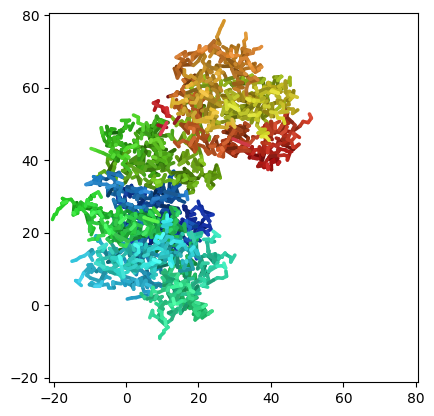

In [ ]:
img = render_protein_pseudo3D(
    prot,
    style="residue_id",
    image_size=(576, 432),
    padding=20,
    upsample=2,
    shadow=0.95,
)
display(img)

# Alternatively, you can save the image using the following:
# img.save("protein.png")

Also we can animate these pseudo 3D plots by using `render_pseudo3D` together with the `animate_frames` function.

Creating frame 1/20
Creating frame 2/20
Creating frame 3/20
Creating frame 4/20
Creating frame 5/20
Creating frame 6/20
Creating frame 7/20
Creating frame 8/20
Creating frame 9/20
Creating frame 10/20
Creating frame 11/20
Creating frame 12/20
Creating frame 13/20
Creating frame 14/20
Creating frame 15/20
Creating frame 16/20
Creating frame 17/20
Creating frame 18/20
Creating frame 19/20
Creating frame 20/20


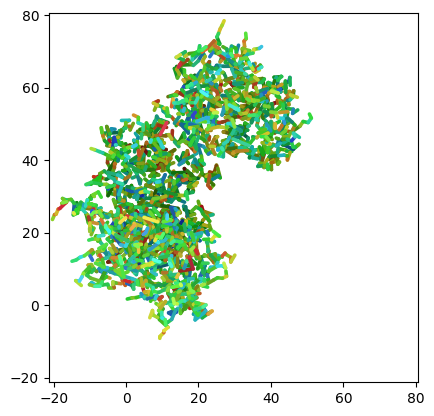

In [ ]:
chains = prot.df["chain"].unique()
segments = [prot.df.loc[prot.df["chain"] == chain_id, ["x", "y", "z"]].to_numpy() for chain_id in chains]
frames = []
num_frames = 20 # number of frames to generate
for i in range(num_frames):
  print(f"Creating frame {i+1}/{num_frames}")
  colors = np.random.randint(50, size=len(prot.df)).astype(float)
  color_segments = [colors[prot.df["chain"] == chain_id] for chain_id in chains]
  frame = render_pseudo3D(segments, c=color_segments, line_w=1.0, image_size=(576, 432), padding=20, upsample=2)
  frames.append(frame)

output_path = "protein_animation.gif"
animate_frames(frames, output_path, title="Pseudo-3D animation", interval=100)

HTML(f'<img src="{output_path}" />')

for more information on the `render_pseudo3D` function and the `animate_frames` function, please refer to our tutorial on [Visualizing the Pseudo-3D Structure](https://github.com/NeurosnapInc/neurosnap/blob/main/example_notebooks/plots_and_animations.ipynb)

#### Bonus: Plotting multiple proteins in a grid
Here, we wrap everything up by presenting an easy way to generate a grid of these plots for a list of proteins.

[*] Found matching structure in AF-DB, downloading and using that.
[*] Found matching structure in AF-DB, downloading and using that.
[*] Found matching structure in AF-DB, downloading and using that.
[*] Found matching structure in AF-DB, downloading and using that.


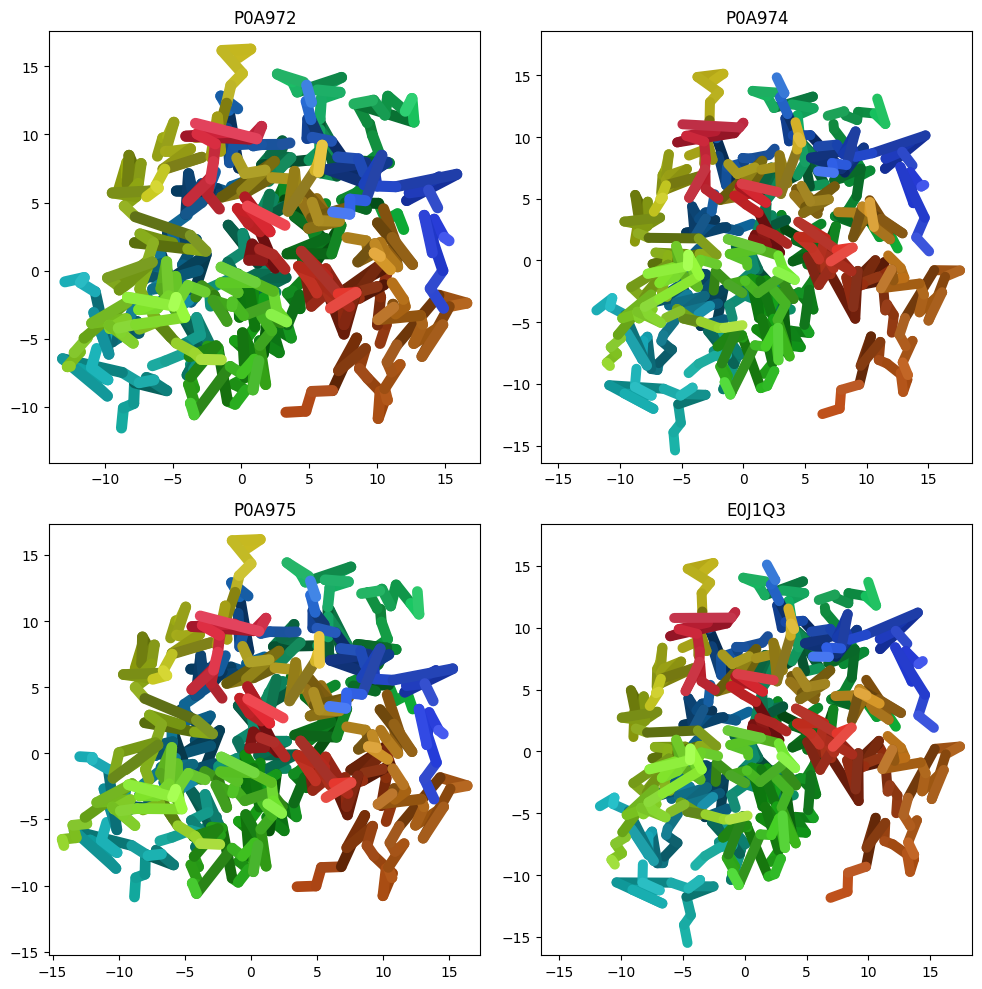

In [ ]:
# Create a 2x2 grid of subplots, you can change the number of rows and columns based on the number of proteins
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))
axes = axes.ravel()  # Flatten axes for easy iteration
ids = [
    "P0A972",
    "P0A974",
    "P0A975",
    "E0J1Q3"
]

# Dictionary comprehension to fetch proteins
proteins = {id: Protein(id) for id in ids}

# Use zip to iterate over axes and proteins
for ax, (id, protein) in zip(axes, proteins.items()):
    img = render_protein_pseudo3D(protein, image_size=(400, 400), padding=20, upsample=2)
    ax.imshow(img)
    ax.set_title(id)
    ax.axis("off")

fig.tight_layout()
plt.show()
# Alternatively, you can save the image using the following:
# fig.savefig("protein.png")